In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.8 MB/s eta 0:00:00a 0:00:01


In [2]:

from ultralytics import YOLO
import torch
print(torch.__version__)              # Check PyTorch version
print(torch.cuda.is_available())      # Should return True



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
2.5.1+cu121
True


In [3]:
model = YOLO("yolov8n.pt")

model.train(
    data='/kaggle/input/leafdate/Leaf/data.yaml',
    epochs=600,
    batch=16,
    device='cuda',
    imgsz=640,          
    cache=True,
    patience = 10          
)


100%|██████████| 6.25M/6.25M [00:00<00:00, 86.9MB/s]


Ultralytics 8.3.143 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/leafdate/Leaf/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=600, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose

100%|██████████| 755k/755k [00:00<00:00, 17.3MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 76.3MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 8.3±1.1 MB/s, size: 26.5 KB)


train: Scanning /kaggle/input/leafdate/Leaf/train/labels... 2260 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2260/2260 [00:05<00:00, 381.74it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/leafdate/Leaf/train is not writeable, cache not saved.


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (2.6GB RAM): 100%|██████████| 2260/2260 [00:04<00:00, 461.80it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 44.0±45.7 MB/s, size: 179.5 KB)


val: Scanning /kaggle/input/leafdate/Leaf/valid/labels... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<00:00, 316.21it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/leafdate/Leaf/valid is not writeable, cache not saved.
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.



val: Caching images (0.2GB RAM): 100%|██████████| 169/169 [00:00<00:00, 468.16it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 600 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/600      2.81G      1.337      2.188      1.475         35        640: 100%|██████████| 142/142 [00:28<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.54it/s]

                   all        169        775      0.576      0.606      0.615      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/600      3.07G      1.253      1.513      1.382         16        640: 100%|██████████| 142/142 [00:26<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.22it/s]

                   all        169        775      0.637      0.557       0.61      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/600      3.38G      1.319      1.476      1.414         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.91it/s]

                   all        169        775      0.507      0.577      0.526      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/600      3.69G      1.363      1.483      1.444         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.73it/s]

                   all        169        775      0.609      0.485      0.531      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/600      4.08G       1.35      1.412      1.448         18        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.96it/s]

                   all        169        775      0.553      0.503      0.543      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/600      4.08G      1.332      1.352      1.438         26        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.16it/s]

                   all        169        775      0.619      0.634      0.661      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/600      4.08G      1.326      1.305      1.422         22        640: 100%|██████████| 142/142 [00:26<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.51it/s]

                   all        169        775      0.674      0.686      0.726      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/600      4.08G      1.294      1.279       1.41         25        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.77it/s]

                   all        169        775      0.642      0.652      0.688      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/600      4.08G      1.284      1.241      1.411         29        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.74it/s]

                   all        169        775      0.657      0.611      0.667      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/600      4.08G       1.28      1.222      1.392         59        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.62it/s]

                   all        169        775      0.687      0.619      0.697      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/600      4.08G      1.263      1.197      1.395         10        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.09it/s]

                   all        169        775       0.68       0.64       0.72      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/600      4.08G      1.246      1.173      1.386         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.78it/s]

                   all        169        775      0.703      0.701      0.761      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/600      4.08G      1.234      1.132      1.369         31        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.76it/s]

                   all        169        775      0.664      0.689      0.739      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/600      4.55G      1.223      1.141       1.38         30        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.86it/s]

                   all        169        775      0.666      0.705      0.744      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/600      4.55G       1.21      1.116      1.361         18        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.86it/s]

                   all        169        775      0.694      0.706      0.744      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/600      4.55G      1.195      1.096      1.355          7        640: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.29it/s]

                   all        169        775       0.73      0.707       0.78      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/600      4.55G      1.198      1.074       1.35         18        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.82it/s]

                   all        169        775      0.718       0.71      0.776      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/600      4.55G      1.198      1.067       1.35         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.91it/s]

                   all        169        775      0.757      0.687      0.794       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/600      4.55G      1.182      1.039      1.331         43        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.79it/s]

                   all        169        775      0.696      0.725      0.758      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/600      4.55G      1.185      1.049      1.327         51        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.55it/s]

                   all        169        775      0.758      0.652       0.78      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/600      4.55G      1.175      1.029      1.322         16        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.95it/s]

                   all        169        775      0.774      0.695      0.804      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/600      4.55G      1.178      1.043      1.316         19        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.23it/s]

                   all        169        775      0.751      0.732      0.813      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/600      4.55G      1.156      1.023      1.326         27        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.03it/s]

                   all        169        775      0.745      0.761      0.825      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/600      4.55G      1.156      1.004      1.319         14        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.10it/s]

                   all        169        775      0.775      0.717       0.81      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/600      4.55G      1.159      1.003      1.313         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.82it/s]

                   all        169        775      0.776      0.737      0.828      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/600      4.55G      1.138      0.976      1.305         31        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.15it/s]

                   all        169        775      0.785      0.741      0.828      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/600      4.55G      1.138     0.9825      1.313         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.93it/s]

                   all        169        775      0.797      0.764       0.85      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/600      4.55G      1.136     0.9581      1.301         24        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.00it/s]

                   all        169        775      0.811       0.75      0.861      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/600      4.55G      1.128     0.9454      1.293         22        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.03it/s]

                   all        169        775      0.794      0.773      0.855      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/600      4.55G      1.123     0.9581      1.282         35        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.76it/s]

                   all        169        775      0.771      0.783      0.849      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/600      4.55G       1.12     0.9414      1.283         16        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.05it/s]

                   all        169        775      0.808      0.782      0.872      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/600      4.55G      1.122     0.9306      1.285         18        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.99it/s]

                   all        169        775      0.804      0.774      0.867      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/600      4.55G      1.112     0.9254      1.282         54        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.91it/s]

                   all        169        775      0.801      0.773      0.864      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/600      4.55G       1.09     0.9052      1.274         23        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.74it/s]

                   all        169        775      0.832      0.767      0.882      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/600      4.55G      1.094     0.9045      1.275         26        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.12it/s]

                   all        169        775      0.811      0.814      0.883      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/600      4.55G      1.089     0.8983      1.275         28        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.05it/s]

                   all        169        775      0.799      0.786      0.885       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/600      4.55G      1.083     0.8859      1.267         16        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.90it/s]

                   all        169        775       0.85      0.802      0.886      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/600      4.55G      1.095     0.9003      1.272         57        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.84it/s]

                   all        169        775      0.838      0.781      0.891      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/600      4.55G      1.085     0.8875      1.263         13        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.18it/s]

                   all        169        775      0.832       0.81      0.888      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/600      4.55G      1.059      0.871       1.26         26        640: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.95it/s]

                   all        169        775      0.821      0.814      0.897      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/600      4.55G      1.091     0.8936      1.268         15        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.54it/s]

                   all        169        775      0.837      0.779       0.88      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/600      4.55G      1.066     0.8786       1.25         29        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.00it/s]

                   all        169        775      0.815      0.823      0.893      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/600      4.55G      1.048      0.865      1.244         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.99it/s]

                   all        169        775      0.824      0.828      0.898      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/600      4.55G      1.053     0.8489      1.238         11        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.90it/s]

                   all        169        775      0.856      0.791      0.897      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/600      4.55G      1.049     0.8472      1.246         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.12it/s]

                   all        169        775      0.833      0.806       0.89      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/600      4.55G      1.059     0.8401      1.235         15        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.12it/s]

                   all        169        775      0.862      0.845       0.92      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/600      4.55G      1.061     0.8363      1.234         32        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.23it/s]

                   all        169        775      0.848       0.83      0.919      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/600      4.55G      1.041     0.8271      1.224         19        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.39it/s]

                   all        169        775      0.829      0.844      0.911       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/600      4.55G      1.041     0.8196      1.226         19        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.01it/s]

                   all        169        775      0.869      0.828      0.916      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/600      4.55G      1.038     0.8212      1.232        129        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.94it/s]

                   all        169        775      0.888      0.844      0.931      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/600      4.55G      1.037     0.8184      1.224         22        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.14it/s]

                   all        169        775      0.855      0.845      0.928      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/600      4.55G      1.023     0.8064      1.217         33        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.85it/s]

                   all        169        775      0.851      0.844      0.919      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/600      4.55G      1.026      0.812      1.224         51        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.09it/s]

                   all        169        775      0.878      0.857      0.939      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/600      4.55G      1.024     0.8089      1.215         27        640: 100%|██████████| 142/142 [00:25<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.63it/s]

                   all        169        775       0.85      0.873      0.932      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/600      4.55G      1.009        0.8      1.211         47        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.13it/s]

                   all        169        775      0.886      0.838      0.941      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/600      4.55G     0.9983     0.7941      1.206         42        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.95it/s]

                   all        169        775      0.882      0.858      0.938      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/600      4.55G      1.002      0.798      1.216         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.95it/s]

                   all        169        775      0.861      0.862       0.93      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/600      4.55G      1.002     0.7882      1.212         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.08it/s]

                   all        169        775       0.87      0.871       0.94      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/600      4.55G      1.009     0.7739      1.205         24        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.15it/s]

                   all        169        775      0.905      0.869      0.947       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/600      4.55G     0.9996     0.7755      1.208         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.94it/s]

                   all        169        775      0.886      0.865      0.939      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/600      4.55G      1.002     0.7765      1.207         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.26it/s]

                   all        169        775      0.902      0.886      0.953       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/600      4.55G     0.9984      0.771      1.199         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.74it/s]

                   all        169        775      0.895      0.889      0.956      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/600      4.55G     0.9934     0.7655      1.193         35        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.18it/s]

                   all        169        775      0.876      0.886      0.945      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/600      4.55G     0.9734     0.7429      1.185         23        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.04it/s]

                   all        169        775        0.9      0.877      0.951      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/600      4.55G     0.9748     0.7519       1.19         24        640: 100%|██████████| 142/142 [00:26<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.05it/s]

                   all        169        775      0.894      0.881      0.954      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/600      4.55G     0.9775     0.7589      1.195         51        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.95it/s]

                   all        169        775      0.864      0.884      0.947       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/600      4.55G      0.991     0.7679      1.186         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.25it/s]

                   all        169        775      0.896      0.914      0.962      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/600      4.55G     0.9676     0.7374      1.178         26        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.99it/s]

                   all        169        775      0.893      0.884      0.958      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/600      4.55G     0.9668     0.7418      1.184         35        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.74it/s]

                   all        169        775      0.917      0.889      0.959      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/600      4.55G     0.9682     0.7373      1.187         24        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.99it/s]

                   all        169        775      0.882      0.918       0.96      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/600      4.55G     0.9615     0.7271      1.175         20        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.97it/s]

                   all        169        775      0.916      0.895      0.963      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/600      4.55G     0.9641     0.7293      1.178         30        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.13it/s]

                   all        169        775      0.906      0.891      0.962      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/600      4.55G     0.9685     0.7317      1.178         22        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.23it/s]

                   all        169        775      0.907      0.934      0.972      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/600      4.55G      0.966     0.7468      1.181         38        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.892      0.917      0.965       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/600      4.55G     0.9478     0.7182      1.174         19        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.31it/s]

                   all        169        775      0.904      0.897       0.96      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/600      4.55G     0.9512     0.7329      1.174         13        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.88it/s]

                   all        169        775      0.928      0.916      0.968      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/600      4.55G     0.9407     0.7265      1.165         41        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.09it/s]

                   all        169        775      0.902      0.917       0.97      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/600      4.55G     0.9427     0.7167      1.168         20        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.905       0.92      0.969      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/600      4.55G     0.9483     0.7141      1.167         87        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.26it/s]

                   all        169        775      0.928      0.905      0.969      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/600      4.55G     0.9397     0.7061      1.159         46        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.29it/s]

                   all        169        775      0.938      0.902      0.972      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/600      4.55G     0.9365     0.6956       1.16         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.25it/s]

                   all        169        775       0.92      0.931      0.974       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/600      4.55G     0.9223     0.6884      1.155         34        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.876      0.946      0.969      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/600      4.55G     0.9401     0.7062      1.159         48        640: 100%|██████████| 142/142 [00:25<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.08it/s]

                   all        169        775      0.913      0.921      0.969      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/600      4.55G     0.9277     0.6978      1.162         26        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.12it/s]

                   all        169        775      0.924      0.928      0.975      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/600      4.55G     0.9236     0.6854      1.162         16        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775      0.936      0.905      0.973      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/600      4.55G     0.9321     0.7022      1.155         16        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.22it/s]

                   all        169        775      0.928       0.92      0.975      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/600      4.55G     0.9273     0.7037      1.161         12        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.26it/s]

                   all        169        775      0.946      0.921      0.976      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/600      4.55G     0.9157     0.6844      1.156         29        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.16it/s]

                   all        169        775      0.944      0.935      0.979      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/600      4.55G     0.9168     0.6843      1.148         13        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.935      0.924      0.977      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/600      4.55G     0.9084     0.6783       1.15         30        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.91it/s]

                   all        169        775      0.955      0.929      0.977        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/600      4.55G     0.9078     0.6743      1.151         24        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.08it/s]

                   all        169        775      0.921      0.936      0.978      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/600      4.55G     0.9062     0.6754      1.142         26        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.22it/s]

                   all        169        775      0.937      0.905      0.973      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/600      4.55G     0.9043     0.6637      1.147         33        640: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.06it/s]

                   all        169        775       0.96      0.917      0.982      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/600      4.55G     0.8965     0.6678      1.144         28        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.92it/s]

                   all        169        775      0.942      0.922      0.979      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/600      4.55G     0.9141     0.6763      1.152         25        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.12it/s]

                   all        169        775      0.933       0.93      0.979      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/600      4.55G     0.8999     0.6649      1.141         44        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.10it/s]

                   all        169        775      0.947      0.937      0.982      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/600      4.55G     0.9078      0.667      1.135         24        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.97it/s]

                   all        169        775      0.942      0.943      0.981      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/600      4.55G      0.898     0.6604      1.138         40        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.07it/s]

                   all        169        775      0.953      0.911       0.98      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/600      4.55G     0.9031     0.6632      1.144         33        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.97it/s]

                   all        169        775      0.948      0.932      0.983       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/600      4.55G     0.9006     0.6679      1.136         42        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.89it/s]

                   all        169        775      0.953       0.95      0.984      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/600      4.55G     0.8865     0.6574      1.127         29        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.30it/s]

                   all        169        775      0.941      0.956      0.982      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/600      4.55G     0.8828     0.6543      1.123         31        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.96it/s]

                   all        169        775       0.95      0.954      0.988       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/600      4.55G     0.8931     0.6554      1.128        132        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.06it/s]

                   all        169        775      0.946      0.949      0.985      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/600      4.55G     0.8853     0.6511      1.129         29        640: 100%|██████████| 142/142 [00:25<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.93it/s]

                   all        169        775      0.954      0.932      0.983       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/600      4.55G     0.8858     0.6488      1.126         42        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.48it/s]

                   all        169        775      0.953      0.938      0.984      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/600      4.55G     0.8812     0.6446      1.122         41        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.97it/s]

                   all        169        775      0.963      0.936      0.986      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/600      4.55G      0.891     0.6464       1.13         39        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.89it/s]

                   all        169        775      0.971      0.937      0.986      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/600      4.55G     0.8749     0.6406      1.126         23        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.30it/s]

                   all        169        775      0.963      0.952      0.987      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/600      4.55G     0.8898     0.6428      1.122         26        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.19it/s]

                   all        169        775      0.956      0.934      0.984      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/600      4.55G     0.8675     0.6288      1.121         46        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.14it/s]

                   all        169        775       0.96      0.954      0.987      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/600      4.55G     0.8643     0.6452       1.12         23        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775      0.967      0.937      0.987      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/600      4.55G     0.8691     0.6357      1.121         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.08it/s]

                   all        169        775      0.973      0.941      0.987      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/600      4.55G     0.8443     0.6165      1.114         28        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.13it/s]

                   all        169        775      0.961       0.95       0.99      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/600      4.55G     0.8715     0.6381      1.121         51        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.958      0.969       0.99      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/600      4.55G     0.8701      0.629      1.115         24        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.11it/s]

                   all        169        775      0.972      0.939      0.988      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/600      4.55G     0.8573     0.6283      1.107          9        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.09it/s]

                   all        169        775      0.967       0.95      0.987      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/600      4.55G     0.8726     0.6364      1.117         28        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.00it/s]

                   all        169        775      0.971       0.95      0.989       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/600      4.55G     0.8776     0.6354      1.113         14        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.80it/s]

                   all        169        775      0.966      0.965      0.991      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/600      4.55G     0.8538      0.624      1.114         22        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775      0.971      0.954      0.989      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/600      4.55G     0.8434     0.6146      1.104         41        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.04it/s]

                   all        169        775      0.975      0.948      0.989      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/600      4.55G     0.8459     0.6212      1.108         88        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.29it/s]

                   all        169        775      0.976      0.965      0.991       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/600      4.55G     0.8484     0.6226      1.116         16        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.99it/s]

                   all        169        775      0.966       0.96      0.989      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/600      4.55G     0.8614     0.6333      1.114         20        640: 100%|██████████| 142/142 [00:26<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.09it/s]

                   all        169        775      0.958      0.968       0.99      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/600      4.55G     0.8479     0.6178      1.106         23        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.37it/s]

                   all        169        775      0.957      0.966      0.991      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/600      4.55G     0.8387     0.6058        1.1         39        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.78it/s]

                   all        169        775      0.962       0.97       0.99      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/600      4.55G      0.827     0.6052      1.103         11        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.33it/s]

                   all        169        775      0.967      0.969      0.991      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/600      4.55G     0.8349     0.6139      1.099         59        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.27it/s]

                   all        169        775      0.974      0.961      0.992      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/600      4.55G      0.839     0.6087      1.095         51        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.12it/s]

                   all        169        775      0.964      0.968      0.991      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/600      4.55G     0.8463     0.6082      1.103         35        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.03it/s]

                   all        169        775      0.969      0.963      0.991      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/600      4.55G     0.8227     0.5944      1.098         28        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.22it/s]

                   all        169        775       0.97      0.952      0.989      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/600      4.55G     0.8318     0.6158      1.102         11        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.13it/s]

                   all        169        775      0.974      0.954      0.991       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/600      4.55G     0.8223     0.6017      1.102         15        640: 100%|██████████| 142/142 [00:25<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.00it/s]

                   all        169        775      0.974      0.952       0.99      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/600      4.55G     0.8394     0.6082        1.1         19        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.92it/s]

                   all        169        775      0.972      0.971      0.992      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/600      4.55G     0.8274     0.6022      1.092         31        640: 100%|██████████| 142/142 [00:26<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.92it/s]

                   all        169        775      0.978      0.956      0.991      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/600      4.55G     0.8271     0.6056      1.095         31        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.80it/s]

                   all        169        775      0.975      0.965       0.99      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/600      4.55G     0.8301     0.6014      1.101         30        640: 100%|██████████| 142/142 [00:26<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.07it/s]

                   all        169        775      0.978      0.964      0.992      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/600      4.55G     0.8102     0.5901       1.09         26        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.99it/s]

                   all        169        775      0.981      0.958      0.991      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/600      4.55G     0.8192     0.5932      1.088         15        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.975      0.968      0.992      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/600      4.55G     0.8141     0.5942      1.087         20        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.14it/s]

                   all        169        775      0.971      0.969      0.992      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/600      4.55G     0.8131     0.5907      1.095         27        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.07it/s]

                   all        169        775      0.977       0.97      0.992      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/600      4.55G      0.818     0.5967      1.093         37        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.11it/s]

                   all        169        775      0.968      0.973      0.992      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/600      4.55G     0.8253     0.5954      1.086         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.20it/s]

                   all        169        775      0.988      0.969      0.992      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/600      4.55G     0.8074     0.5849      1.083         33        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.44it/s]

                   all        169        775      0.983      0.974      0.993      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/600      4.55G     0.8215      0.598      1.095         35        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.00it/s]

                   all        169        775      0.978      0.964      0.993      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/600      4.55G     0.7954     0.5695      1.082         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.15it/s]

                   all        169        775      0.979      0.965      0.992      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/600      4.55G     0.8185     0.5914      1.086         31        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.05it/s]

                   all        169        775      0.981      0.972      0.993       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/600      4.55G     0.8059     0.5792      1.081         86        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.10it/s]

                   all        169        775      0.985      0.963      0.993      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/600      4.55G     0.8093     0.5865      1.084         18        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.05it/s]

                   all        169        775      0.989      0.969      0.992      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/600      4.55G     0.8116     0.5785       1.09         18        640: 100%|██████████| 142/142 [00:26<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.12it/s]

                   all        169        775      0.977       0.97      0.993       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/600      4.55G     0.8199     0.5888      1.076         18        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.85it/s]

                   all        169        775      0.984      0.979      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/600      4.55G     0.8064     0.5707      1.076         38        640: 100%|██████████| 142/142 [00:26<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.01it/s]

                   all        169        775      0.977      0.973      0.993      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/600      4.55G     0.7996     0.5779      1.076         37        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.13it/s]

                   all        169        775      0.981      0.974      0.993      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/600      4.55G     0.7864     0.5629      1.068         24        640: 100%|██████████| 142/142 [00:26<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.18it/s]

                   all        169        775      0.987      0.966      0.993      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/600      4.55G     0.8024     0.5796      1.079         24        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.97it/s]

                   all        169        775      0.973      0.974      0.991      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/600      4.55G     0.7971     0.5745      1.079         18        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.97it/s]

                   all        169        775      0.988      0.965      0.993      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/600      4.55G     0.7877     0.5684      1.077         27        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.17it/s]

                   all        169        775      0.989      0.962      0.993      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/600      4.55G     0.7909     0.5683      1.073         19        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.77it/s]

                   all        169        775      0.982      0.968      0.993      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/600      4.55G     0.7957      0.572      1.075         28        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.03it/s]

                   all        169        775      0.962      0.983      0.992      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/600      4.55G     0.7964     0.5755      1.077         23        640: 100%|██████████| 142/142 [00:25<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.09it/s]

                   all        169        775       0.96       0.98      0.991      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/600      4.55G     0.7965     0.5733      1.075         36        640: 100%|██████████| 142/142 [00:26<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.977      0.969      0.992      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/600      4.55G     0.7824     0.5581      1.071         37        640: 100%|██████████| 142/142 [00:25<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775      0.985      0.957      0.992      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/600      4.55G     0.7938     0.5731      1.076         20        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.07it/s]

                   all        169        775      0.987      0.966      0.993      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/600      4.55G     0.7827      0.558      1.072         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775       0.98      0.966      0.993       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/600      4.55G     0.7842      0.563      1.071         37        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.96it/s]

                   all        169        775       0.98      0.971      0.993      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/600      4.55G     0.7917     0.5731      1.072         49        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.23it/s]

                   all        169        775      0.977       0.97      0.992      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/600      4.55G     0.7821     0.5583      1.065         53        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.94it/s]

                   all        169        775      0.979      0.973      0.992      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/600      4.55G      0.763     0.5429      1.063         24        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.23it/s]

                   all        169        775      0.975      0.974      0.992      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/600      4.55G     0.7822     0.5617      1.068         36        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.16it/s]

                   all        169        775      0.978      0.973      0.993       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/600      4.55G     0.7759     0.5685      1.076         18        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.16it/s]

                   all        169        775      0.974      0.972      0.992      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/600      4.55G       0.79     0.5764      1.066         38        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.12it/s]

                   all        169        775      0.984      0.974      0.992      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/600      4.55G     0.7782     0.5624       1.06          8        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.86it/s]

                   all        169        775      0.977      0.982      0.991      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/600      4.55G     0.7895     0.5647      1.073         10        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.28it/s]

                   all        169        775      0.974      0.978      0.992      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/600      4.55G      0.778     0.5527      1.064         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.15it/s]

                   all        169        775      0.986      0.971      0.993      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/600      4.55G     0.7729     0.5524      1.063         27        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.91it/s]

                   all        169        775      0.981      0.973      0.992      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/600      4.55G     0.7603     0.5414      1.062         31        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.70it/s]

                   all        169        775      0.981       0.97      0.992      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/600      4.55G     0.7628     0.5504      1.063         39        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.40it/s]

                   all        169        775      0.981      0.972      0.992       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/600      4.55G     0.7741     0.5521      1.058         29        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.13it/s]

                   all        169        775      0.984      0.975      0.993      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/600      4.55G     0.7721      0.546      1.067         30        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.93it/s]

                   all        169        775      0.989      0.965      0.993      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/600      4.55G     0.7832     0.5671      1.069         22        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775      0.982      0.973      0.992      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/600      4.55G     0.7577     0.5442      1.059         46        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.87it/s]

                   all        169        775      0.981      0.972      0.993       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/600      4.55G     0.7645      0.548      1.058         52        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.10it/s]

                   all        169        775      0.986      0.975      0.993      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/600      4.55G     0.7649     0.5466      1.054         22        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.15it/s]

                   all        169        775      0.982      0.976      0.993      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/600      4.55G     0.7667     0.5452      1.056         30        640: 100%|██████████| 142/142 [00:26<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.15it/s]

                   all        169        775      0.979      0.977      0.993      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/600      4.55G     0.7517     0.5322      1.053         37        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.99it/s]

                   all        169        775      0.986      0.973      0.993      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/600      4.55G     0.7568      0.536      1.051         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.15it/s]

                   all        169        775      0.991      0.973      0.994      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/600      4.55G     0.7574     0.5381      1.056         23        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.99it/s]

                   all        169        775      0.991      0.965      0.993      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/600      4.55G     0.7574     0.5373      1.053         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.11it/s]

                   all        169        775      0.973      0.978      0.994      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/600      4.55G     0.7457     0.5307      1.048         19        640: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775      0.982      0.986      0.994      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/600      4.55G     0.7541     0.5419      1.054         36        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.18it/s]

                   all        169        775      0.977      0.986      0.994      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/600      4.55G     0.7474     0.5384       1.05         38        640: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.08it/s]

                   all        169        775      0.975      0.987      0.994      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/600      4.55G     0.7501     0.5323      1.047         27        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.17it/s]

                   all        169        775      0.976      0.985      0.994      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/600      4.55G     0.7473     0.5368       1.05         33        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.991      0.977      0.994      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/600      4.55G      0.746     0.5309      1.056         10        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.94it/s]

                   all        169        775      0.983       0.98      0.994      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/600      4.55G       0.75      0.537      1.054         49        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.15it/s]

                   all        169        775      0.987      0.983      0.994      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/600      4.55G     0.7535     0.5355      1.051         29        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.30it/s]

                   all        169        775       0.99      0.972      0.994        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/600      4.55G     0.7453     0.5353      1.053         78        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.10it/s]

                   all        169        775      0.986      0.976      0.994      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/600      4.55G     0.7541     0.5369       1.05         41        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.22it/s]

                   all        169        775      0.984      0.982      0.994      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/600      4.55G     0.7437     0.5294      1.052         18        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.91it/s]

                   all        169        775       0.99      0.983      0.995      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/600      4.55G      0.746     0.5265      1.047         80        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.10it/s]

                   all        169        775      0.996      0.985      0.995      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/600      4.55G     0.7467     0.5373      1.052         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.71it/s]

                   all        169        775      0.992      0.987      0.995      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/600      4.55G     0.7431     0.5283      1.051         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.17it/s]

                   all        169        775      0.989      0.987      0.994      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/600      4.55G     0.7368     0.5246      1.051         20        640: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775       0.99      0.986      0.995      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/600      4.55G     0.7417     0.5246      1.052         28        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.26it/s]

                   all        169        775      0.989      0.983      0.994      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/600      4.55G     0.7477     0.5255      1.047         33        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.11it/s]

                   all        169        775      0.988       0.99      0.994      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/600      4.55G     0.7403     0.5371      1.043         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.26it/s]

                   all        169        775      0.988      0.987      0.994      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/600      4.55G     0.7284      0.516       1.04         38        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.62it/s]

                   all        169        775      0.991      0.983      0.994      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/600      4.55G     0.7332     0.5241       1.04         44        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.34it/s]

                   all        169        775      0.987      0.983      0.994      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/600      4.55G     0.7351     0.5258      1.046         53        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.06it/s]

                   all        169        775      0.983      0.987      0.994      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/600      4.55G     0.7263     0.5171      1.037         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.93it/s]

                   all        169        775      0.991       0.98      0.994       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/600      4.55G     0.7322     0.5261      1.045         41        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.16it/s]

                   all        169        775      0.987      0.986      0.994       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/600      4.55G      0.739     0.5232      1.041         42        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.30it/s]

                   all        169        775      0.991      0.981      0.994      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/600      4.55G     0.7174     0.5136      1.039         39        640: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.79it/s]

                   all        169        775       0.99      0.983      0.994      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/600      4.55G     0.7444      0.531      1.045         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.09it/s]

                   all        169        775       0.99      0.986      0.994      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/600      4.55G     0.7252     0.5176      1.045         36        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.92it/s]

                   all        169        775       0.99      0.983      0.994      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/600      4.55G     0.7343      0.518      1.043         48        640: 100%|██████████| 142/142 [00:25<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.13it/s]

                   all        169        775       0.99      0.981      0.994      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/600      4.55G     0.7334     0.5191      1.047         40        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.97it/s]

                   all        169        775      0.991      0.983      0.994      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/600      4.55G     0.7234     0.5241      1.041         44        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.41it/s]

                   all        169        775      0.995      0.978      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/600      4.55G     0.7347     0.5228      1.046         18        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.22it/s]

                   all        169        775      0.993       0.98      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/600      4.55G      0.735     0.5171      1.037         29        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.39it/s]

                   all        169        775      0.992      0.972      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/600      4.55G     0.7232     0.5135      1.032         15        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.98it/s]

                   all        169        775      0.997      0.977      0.994      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/600      4.55G     0.7141     0.5056       1.04         32        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.12it/s]

                   all        169        775      0.993      0.981      0.994      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/600      4.55G      0.722       0.52      1.032         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.27it/s]

                   all        169        775      0.996      0.979      0.994      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/600      4.55G     0.7255     0.5156       1.04         15        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.16it/s]

                   all        169        775      0.991      0.979      0.994      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/600      4.55G     0.7155     0.5061       1.03         32        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.06it/s]

                   all        169        775       0.99      0.983      0.994      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/600      4.55G      0.717     0.5061      1.034          8        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.84it/s]

                   all        169        775       0.99      0.983      0.994      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/600      4.55G     0.7227     0.5153      1.038         59        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.28it/s]

                   all        169        775      0.992      0.982      0.994      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/600      4.55G      0.727     0.5129      1.032         29        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.27it/s]

                   all        169        775      0.987      0.983      0.994      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/600      4.55G     0.7195      0.511      1.034         24        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.36it/s]

                   all        169        775      0.994      0.977      0.993      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/600      4.55G     0.7174     0.5076      1.038         12        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.19it/s]

                   all        169        775      0.995      0.979      0.993      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/600      4.55G     0.7223     0.5123       1.04         28        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.22it/s]

                   all        169        775      0.993      0.979      0.994      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/600      4.55G     0.7232     0.5129      1.032         33        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.42it/s]

                   all        169        775      0.992      0.981      0.994      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/600      4.55G     0.7064     0.5041      1.028         31        640: 100%|██████████| 142/142 [00:25<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.06it/s]

                   all        169        775      0.993      0.981      0.994       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/600      4.55G     0.7157      0.507      1.037         20        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.93it/s]

                   all        169        775      0.995      0.983      0.994      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/600      4.55G     0.7149     0.5069      1.032         16        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.23it/s]

                   all        169        775      0.995      0.983      0.994      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    235/600      4.55G      0.711     0.4986      1.025         25        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.28it/s]

                   all        169        775      0.994      0.981      0.994      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    236/600      4.55G     0.7131     0.5053       1.03         23        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.10it/s]

                   all        169        775       0.99      0.983      0.994      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    237/600      4.55G     0.7147     0.5018       1.02         71        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.81it/s]

                   all        169        775      0.994      0.986      0.995      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    238/600      4.55G     0.7157     0.5048      1.032         34        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.20it/s]

                   all        169        775      0.995      0.988      0.995      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/600      4.55G     0.6955      0.492      1.027         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  6.00it/s]

                   all        169        775      0.995      0.986      0.995      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/600      4.55G     0.7163     0.5053      1.036         19        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.10it/s]

                   all        169        775      0.995       0.98      0.995      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/600      4.55G      0.694     0.4914      1.019         31        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.35it/s]

                   all        169        775      0.993      0.982      0.995      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/600      4.55G     0.7119     0.5004      1.028         41        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.02it/s]

                   all        169        775      0.992      0.985      0.995      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/600      4.55G     0.7125     0.5048      1.032         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.22it/s]

                   all        169        775      0.993      0.983      0.995      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/600      4.55G      0.704     0.4992      1.027         58        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.11it/s]

                   all        169        775      0.992      0.985      0.995      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/600      4.55G     0.6965     0.4931      1.019         32        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.87it/s]

                   all        169        775      0.992      0.985      0.995      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/600      4.55G     0.7039     0.4956      1.023         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.23it/s]

                   all        169        775      0.995      0.983      0.995       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/600      4.55G     0.7014     0.4958      1.026         13        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.06it/s]

                   all        169        775      0.997      0.983      0.995      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/600      4.55G     0.7077     0.4976      1.023         37        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.27it/s]

                   all        169        775      0.997      0.982      0.995      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/600      4.55G      0.702     0.4947      1.023         16        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.16it/s]

                   all        169        775      0.996      0.986      0.995      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/600      4.55G     0.6923      0.493      1.018         43        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.04it/s]

                   all        169        775      0.996      0.983      0.995      0.928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    251/600      4.55G     0.7088     0.5017      1.023         17        640: 100%|██████████| 142/142 [00:25<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.01it/s]

                   all        169        775      0.989      0.986      0.995       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    252/600      4.55G     0.6859     0.4824      1.023         36        640: 100%|██████████| 142/142 [00:26<00:00,  5.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.05it/s]

                   all        169        775      0.992      0.988      0.995      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    253/600      4.55G     0.6901     0.4869      1.022         34        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.18it/s]

                   all        169        775      0.993      0.987      0.995      0.927



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    254/600      4.55G     0.6868     0.4868      1.022         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        169        775      0.992      0.985      0.995      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    255/600      4.55G     0.7013     0.4917       1.02         33        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.10it/s]

                   all        169        775      0.993      0.984      0.995      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    256/600      4.55G     0.6906     0.4845      1.019         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.67it/s]

                   all        169        775      0.988      0.989      0.995       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    257/600      4.55G     0.6869     0.4842      1.019         32        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.35it/s]

                   all        169        775      0.991      0.985      0.995       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    258/600      4.55G     0.6955     0.4881      1.021         16        640: 100%|██████████| 142/142 [00:25<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.27it/s]

                   all        169        775      0.991       0.99      0.995      0.928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    259/600      4.55G     0.7041     0.4873      1.019         21        640: 100%|██████████| 142/142 [00:25<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.81it/s]

                   all        169        775      0.994      0.988      0.995      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    260/600      4.55G     0.6846      0.483       1.02         25        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.94it/s]

                   all        169        775       0.99      0.986      0.995       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    261/600      4.55G     0.6881     0.4859      1.017         27        640: 100%|██████████| 142/142 [00:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.11it/s]

                   all        169        775      0.991      0.985      0.994       0.93
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 251, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



261 epochs completed in 1.967 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.143 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.82it/s]


                   all        169        775       0.99      0.987      0.995       0.93


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.0ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b19cb99cac0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [4]:
model.save('/kaggle/working/Leaf.pt')

In [5]:
from ultralytics import YOLO

model = YOLO('/kaggle/working/Leaf.pt')

results = model.val()
print(results) 

Ultralytics 8.3.143 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 78.5±44.4 MB/s, size: 35.1 KB)


val: Scanning /kaggle/input/leafdate/Leaf/valid/labels... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:00<00:00, 887.02it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/leafdate/Leaf/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.03it/s]


                   all        169        775      0.989      0.986      0.995      0.929


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 1.2ms preprocess, 3.5ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b19cb163220>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.040

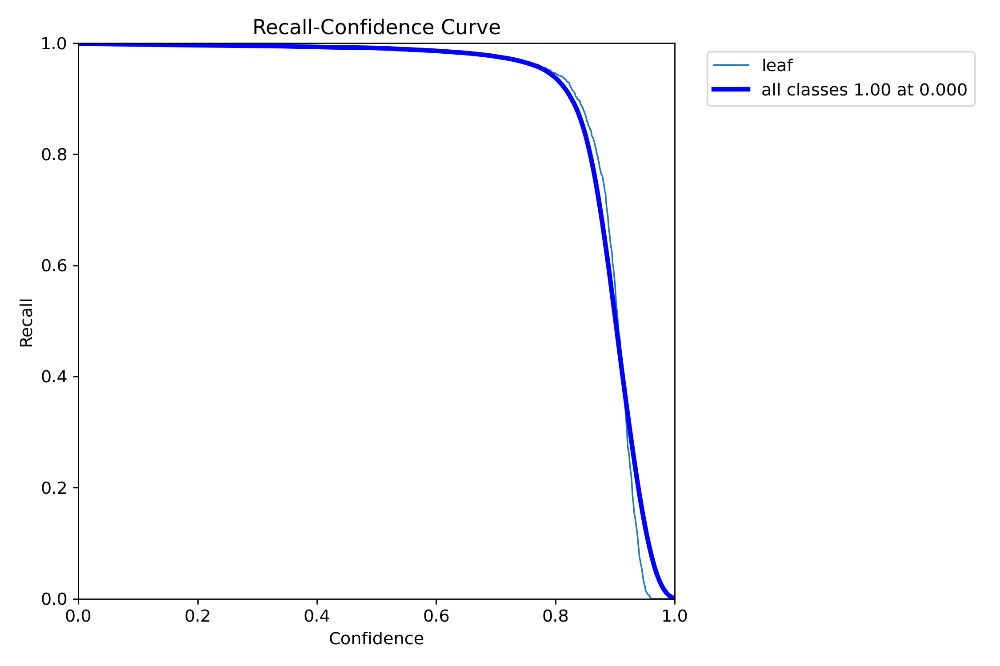

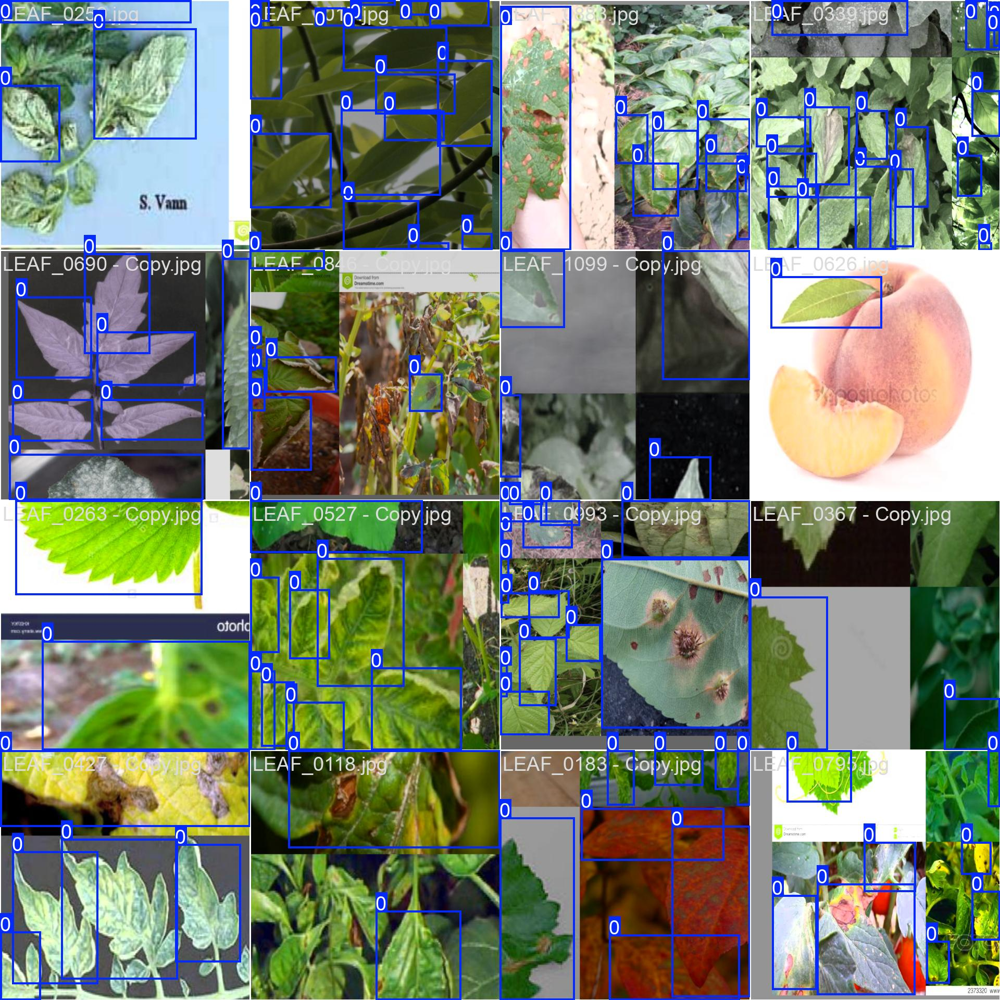

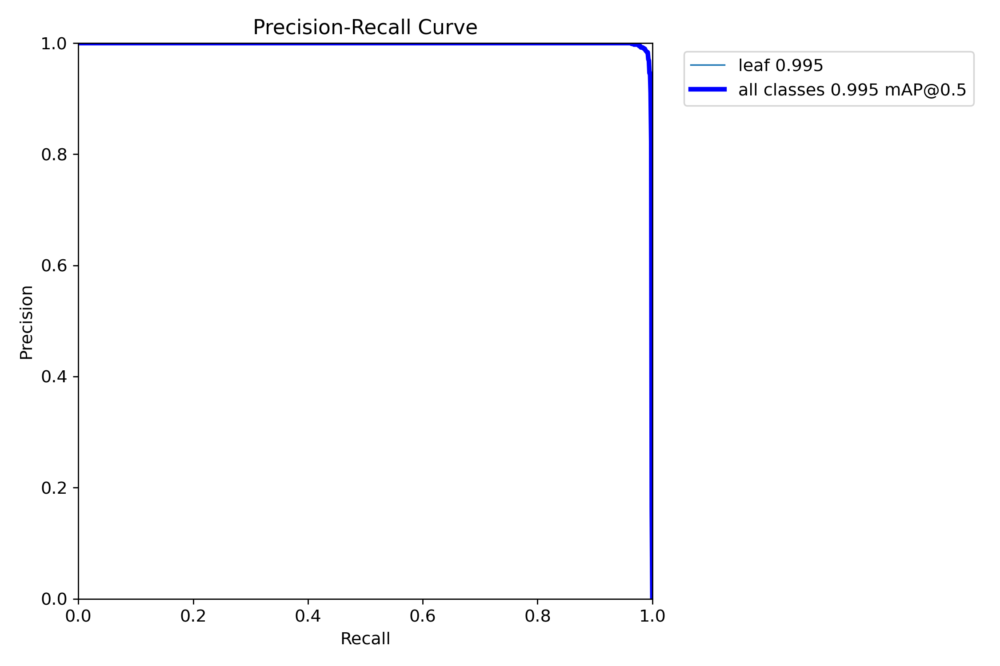

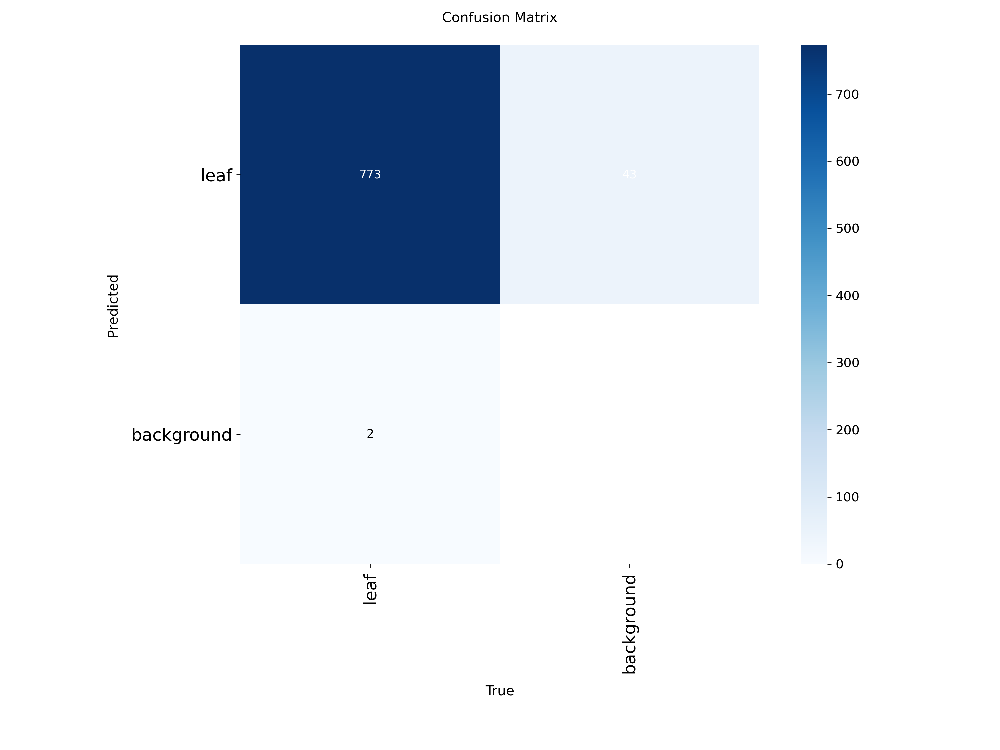

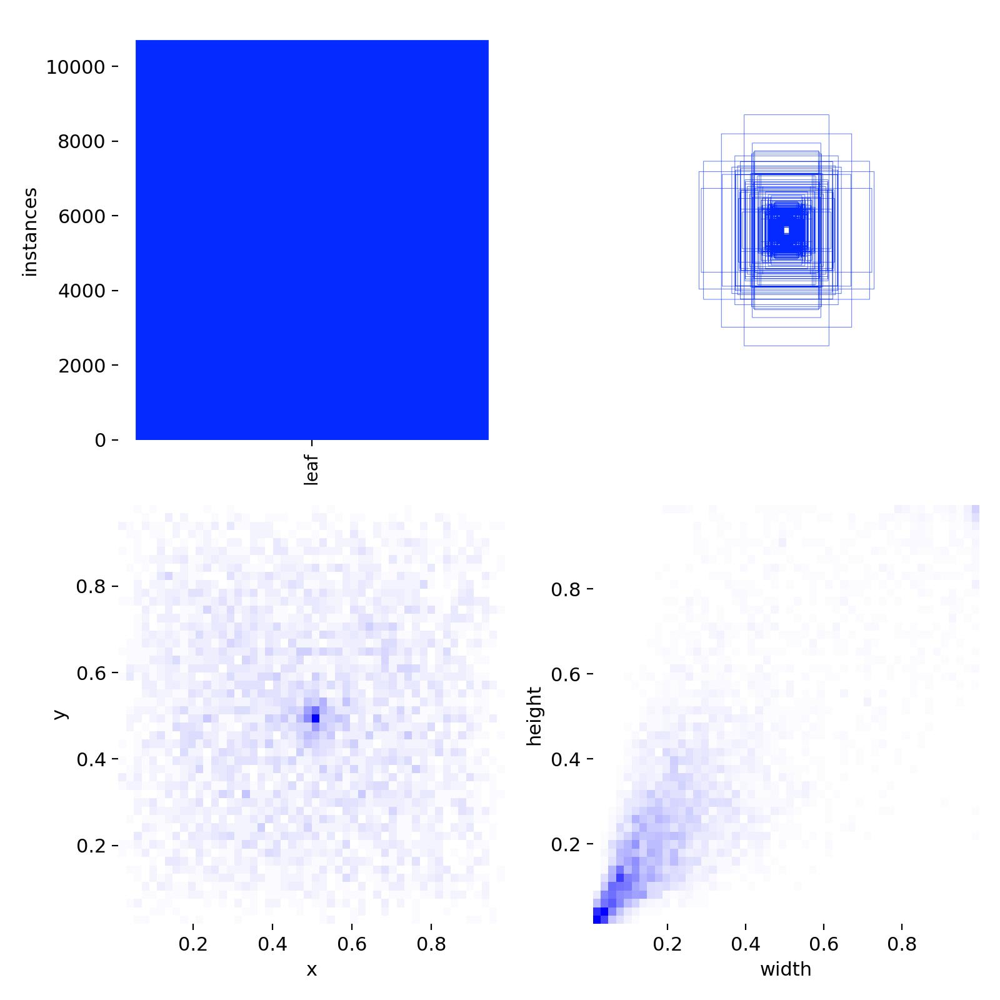

...

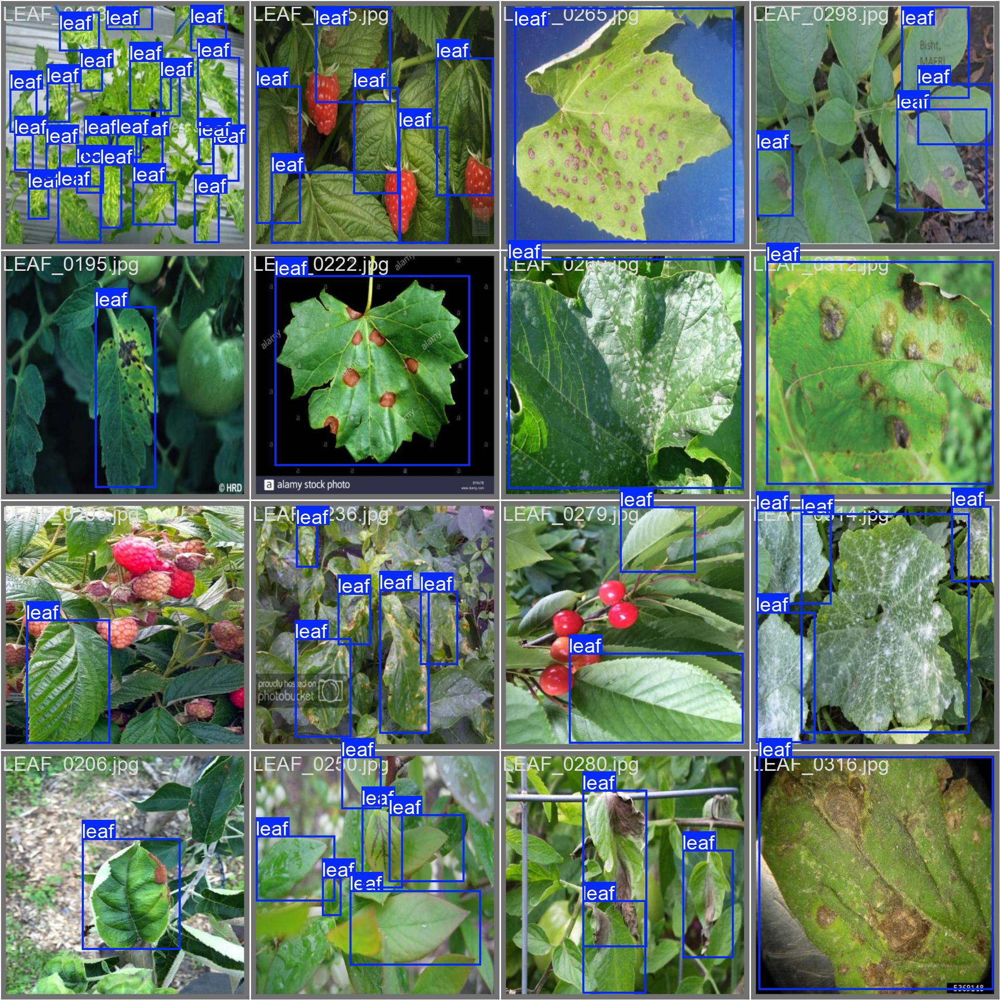

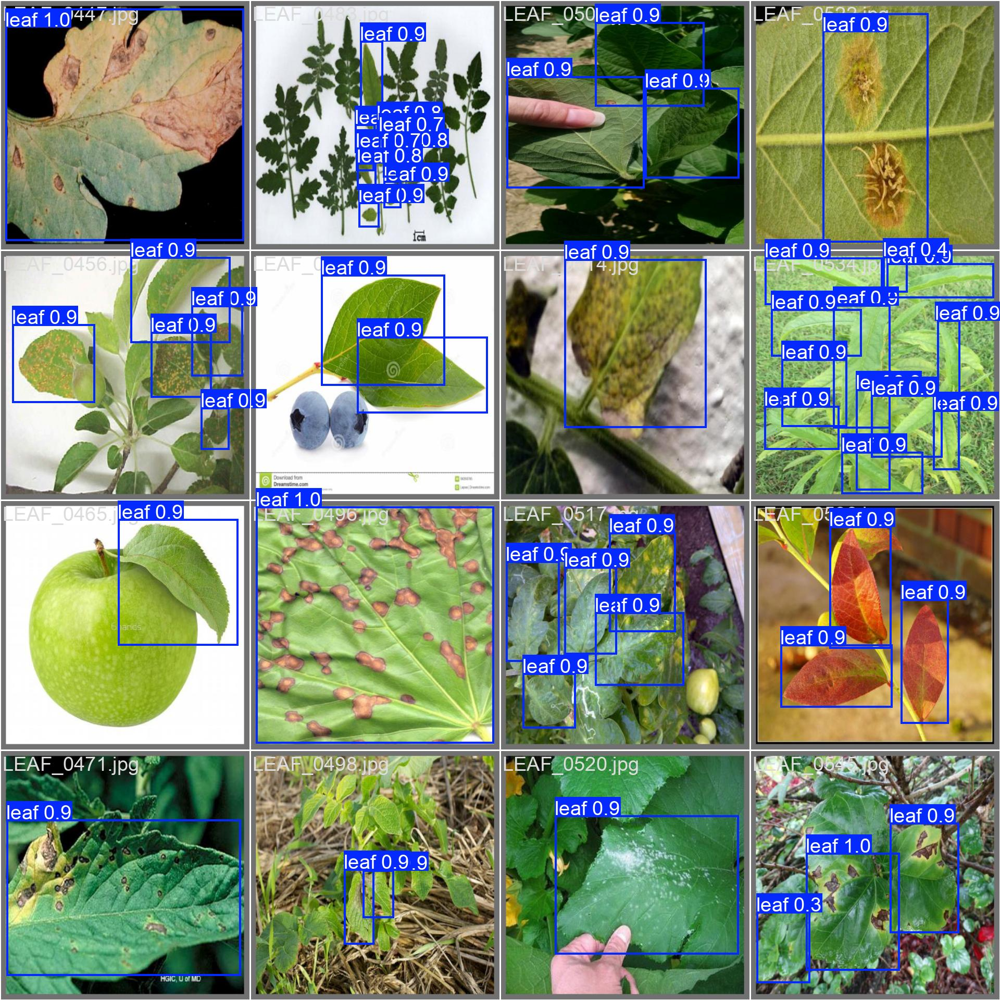

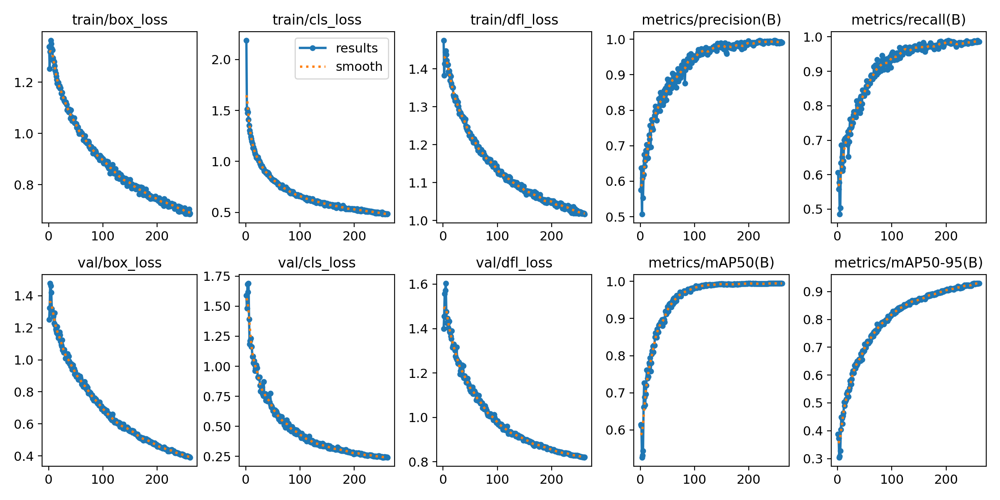

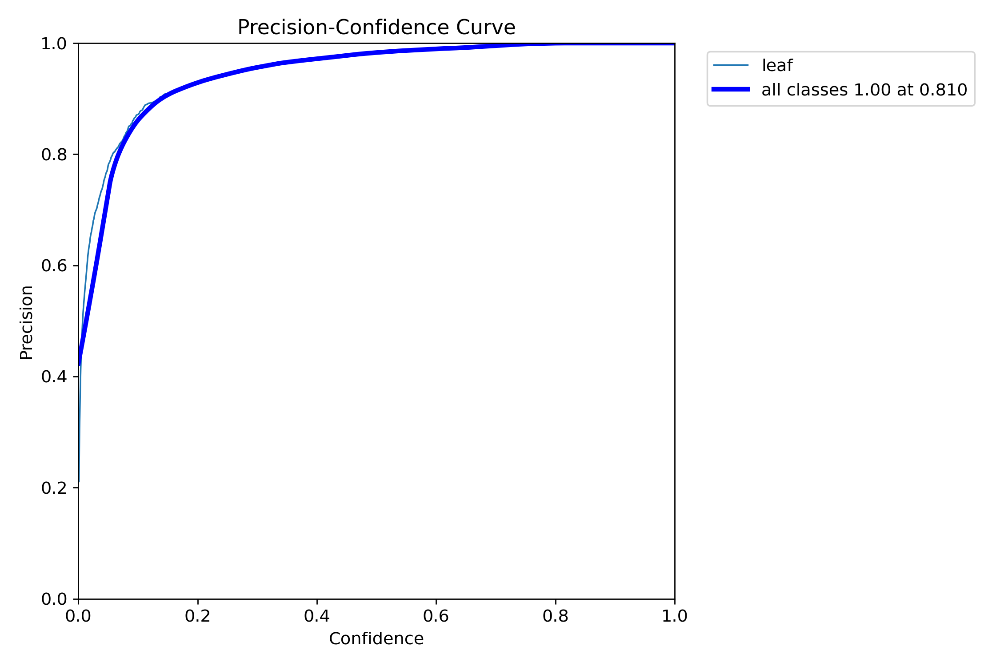

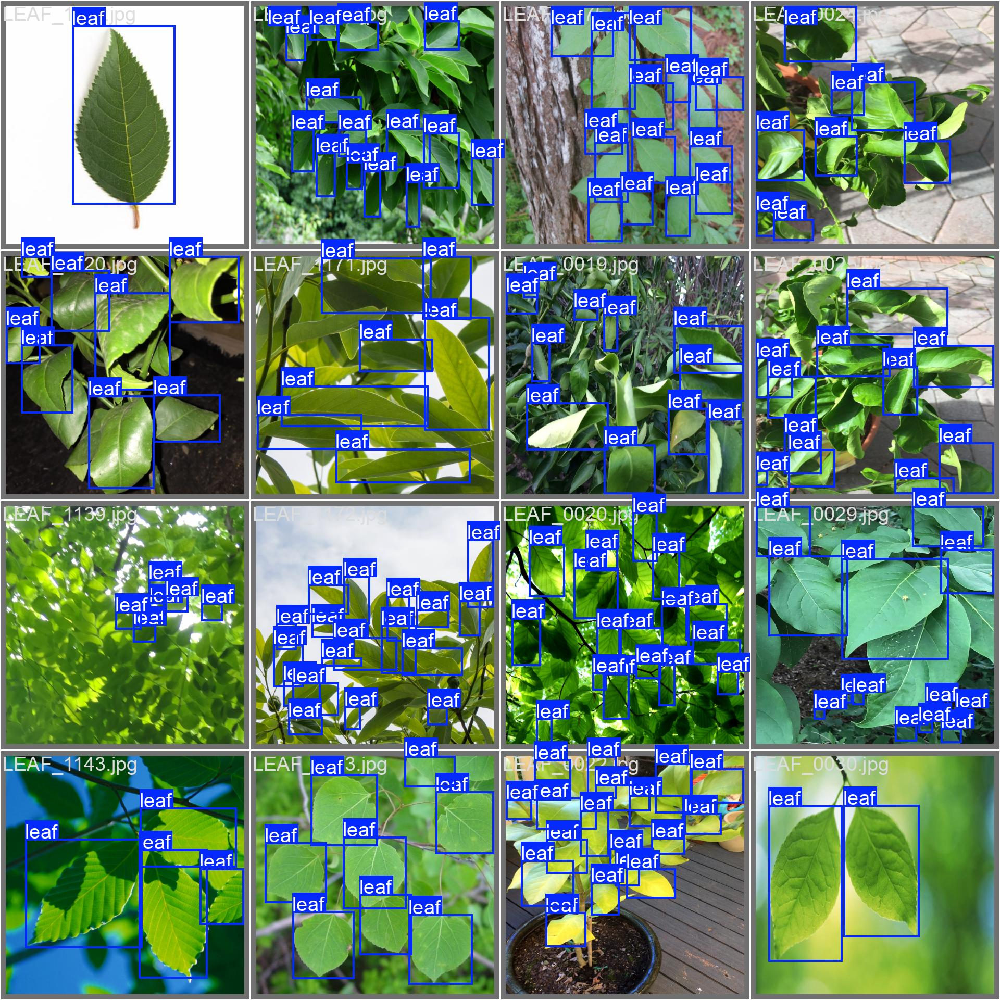

In [6]:
import os
from IPython.display import Image, display

path='/kaggle/working/runs/detect/train'
image=[f for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]

for i in range(len(image)):
    display(Image(filename=path+'/'+image[i]))